Modified from:

[https://www.tensorflow.org/beta/tutorials/generative/adversarial_fgsm](https://www.tensorflow.org/beta/tutorials/generative/adversarial_fgsm).


GitHub: https://github.com/MYUSER/MYPROJECT/

Welcome to your assignment this week! 

To better understand adverse attacks againsts AI and how it is possible to fool an AI system, in this assignment, we will look at a Computer Vision use case. 




This assessment creates an *adversarial example* using the Fast Gradient Signed Method (FGSM) attack as described in [Explaining and Harnessing Adversarial Examples](https://arxiv.org/abs/1412.6572) by Goodfellow *et al*. This was one of the first and most popular attacks to fool a neural network. 

# What is an adversarial example?

Adversarial examples are specialised inputs created with the purpose of confusing a neural network, resulting in the misclassification of a given input. These notorious inputs are indistinguishable to the human eye, but cause the network to fail to identify the contents of the image. There are several types of such attacks, however, here the focus is on the fast gradient sign method attack, which is a *white box* attack whose goal is to ensure misclassification. A white box attack is where the attacker has complete access to the model being attacked.

# Fast gradient sign method
The fast gradient sign method works by using the gradients of the neural network to create an adversarial example. For an input image, the method uses the gradients of the loss with respect to the input image to create a new image that maximises the loss. This new image is called the adversarial image. This can be summarised using the following expression:
$$adv\_x = x + \epsilon*\text{sign}(\nabla_xJ(\theta, x, y))$$

where 

*   adv_x : Adversarial image.
*   x : Original input image.
*   y : Original input label.
*   $\epsilon$ : Multiplier to ensure the perturbations are small.
*   $\theta$ : Model parameters.
*   $J$ : Loss.

An intriguing property here, is the fact that the gradients are taken with respect to the input image. This is done because the objective is to create an image that maximises the loss. A method to accomplish this is to find how much each pixel in the image contributes to the loss value, and add a perturbation accordingly. This works pretty fast because it is easy find how each input pixel contributes to the loss, by using the chain rule, and finding the required gradients. Hence, the gradients are used with respect to the image. In addition, since the model is no longer being trained (thus the gradient is not taken with respect to the trainable variables, i.e., the model parameters), and so the model parameters remain constant. The only goal is to fool an already trained model.



# Part 1

So let's try and fool a pretrained model. In this first part, the model is [MobileNetV2](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/keras/applications/MobileNetV2) model, pretrained on [ImageNet](http://www.image-net.org/).


Run the following cell to install all the packages you will need.

In [1]:
# ! pip3 install cython
# ! pip3 install tensornets
# ! pip3 install numpy==1.16.1
# ! pip3 install tensorflow
# ! pip3 install matplotlib

Run the following cell to load the packages you will need.

In [2]:
import tensorflow.compat.v1 as tf
tf.disable_v2_behavior()
import matplotlib as mpl
import matplotlib.pyplot as plt
import tensornets as nets
import numpy as np
import os
from os.path import expanduser
import json
import pandas as pd

tf.get_logger().setLevel('INFO')

/home/rohan/works/env/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:516: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/home/rohan/works/env/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:517: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/home/rohan/works/env/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:518: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
/home/rohan/works/env/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.

Instructions for updating:
non-resource variables are not supported in the long term


In [3]:
config = tf.ConfigProto()
config.gpu_options.allow_growth = True
config.log_device_placement = True
config.allow_soft_placement = True
sess = tf.Session(config=config)

Let's define the computation graph.

In [4]:
# Helper function to preprocess the image so that it can be inputted in MobileNetV2
def preprocess(image):
    image = tf.cast(image, tf.float32)
    image = tf.image.resize(image, (224, 224))
    image = image /  127.5
    image = image - 1.0
    image = image[None, ...]
    return image

def reverse_preprocess(image):
    image = image + 1.0
    image = image / 2.0
    return image

# Helper function to extract labels from probability vector
def get_imagenet_label(probs):
    return decode_predictions(probs, top=5)[0]


# Lets's import an image to process.
image_path = tf.keras.utils.get_file('YellowLabradorLooking_new.jpg', 'https://storage.googleapis.com/download.tensorflow.org/example_images/YellowLabradorLooking_new.jpg')
image_raw = tf.io.read_file(image_path)
image = tf.image.decode_png(image_raw)
input_image = preprocess(image)
reversed_image = reverse_preprocess(input_image)

input_image_placeholder = tf.placeholder(shape=[1, 224, 224, 3], dtype=tf.float32)

pretrained_model = nets.MobileNet50v2(input_image_placeholder, reuse=tf.AUTO_REUSE)

# node to load pretrained weights
pretrained_ops = pretrained_model.pretrained()

# decode predicted probabilities to ImageNet labels
decode_predictions = tf.keras.applications.mobilenet_v2.decode_predictions


## Original image
Let's use a sample image of a [Labrador Retriever](https://commons.wikimedia.org/wiki/File:YellowLabradorLooking_new.jpg) -by Mirko       [CC-BY-SA 3.0](https://creativecommons.org/licenses/by-sa/3.0/) from Wikimedia Common and create adversarial examples from it. The first step is to preprocess it so that it can be fed as an input to the MobileNetV2 model.

In [5]:
config = tf.ConfigProto()
config.gpu_options.allow_growth = True
config.log_device_placement = True
sess = tf.Session(config=config)

sess.run(pretrained_ops)
preprocessed_img, reversed_img = sess.run([input_image, reversed_image])
image_probs = sess.run([pretrained_model], {input_image_placeholder:preprocessed_img})

Let's have a look at the image.

['Labrador_retriever', 'Ibizan_hound', 'Saluki', 'Chesapeake_Bay_retriever', 'Weimaraner']


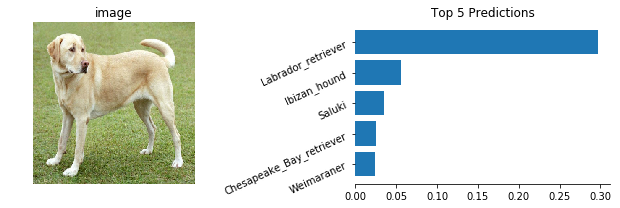

In [6]:
# the original image top 5 predictions
orig_top5 = get_imagenet_label(image_probs[0])
tick_names = [x[1] for x in orig_top5]
print(tick_names)

def plot_classified_figure():
    probs = [x[2] for x in orig_top5]
    plt.figure(figsize=(9, 3))
    plt.subplot(121)
    plt.imshow(reversed_img[0])
    plt.title('image')
    ax = plt.gca()
    ax.axis('off')

    plt.subplot(122)
    tick_names = [x[1] for x in reversed(orig_top5)]
    probs = [x[2] for x in reversed(orig_top5)]
    plt.barh(tick_names, probs)
    plt.yticks(rotation=25)
    plt.title('Top 5 Predictions')
    ax = plt.gca()
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['left'].set_visible(False)
    plt.tight_layout()
    plt.show()
    
plot_classified_figure()

# Create the adversarial image

## Implementing fast gradient sign method
The first step is to create perturbations which will be used to distort the original image resulting in an adversarial image. As mentioned, for this task, the gradients are taken with respect to the image.

**TASK 1:** Implement `create_adversarial_pattern()`. You will need to carry out 3 steps:

1. Create a loss object using `loss_object` using two arguments: `pretrained_model` and `input_label`.
2. Get the gradients using `tf.gradients` of the `loss`  w.r.t to the `input_image`.
3. Get the sign of the gradients to create the perturbation using `tf.sign`.


In [7]:
loss_object = tf.keras.losses.SparseCategoricalCrossentropy()

def create_adversarial_pattern(input_image, input_label, pretrained_model):
    ## START YOU CODE HERE (3 lines)
    # since this is sparse categorical crossentropy, we need one array of integer index as class label and another predicted probability distribution(from pretrained_model)
    loss = loss_object(input_label, pretrained_model)     
    gradient = tf.gradients(loss, input_image_placeholder)
    signed_grad = tf.sign(gradient)
    # END
    return signed_grad

The resulting perturbations can also be visualised.

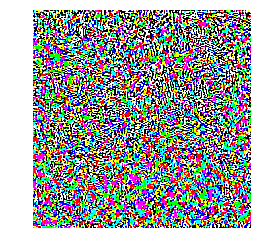

In [8]:
# perturbations = create_adversarial_pattern(input_image_placeholder, tf.argmax(pretrained_model,1))

# Actual label index for sample: Labrador Retriever
input_label = np.array([208])
perturbations = create_adversarial_pattern(input_image_placeholder, input_label, pretrained_model)

p_cliped = tf.clip_by_value(perturbations, 0, 1)

p_cliped_val = sess.run(p_cliped, {input_image_placeholder: preprocessed_img})
plt.figure()
# since the input_image_placeholder is tensor of shape [1, 224, 224, 3], we take values from 2nd inner array since the 1st dim denotes batch size.
plt.imshow(p_cliped_val[0][0])
plt.gca().axis('off')
plt.show()

## Fool the AI system

Let's try this out for different values of epsilon and observe the resultant image. You'll notice that as the value of epsilon is increased, it becomes easier to fool the network, however, this comes as a trade-off which results in the perturbations becoming more identifiable.

In [9]:
def display_images(image, description, preprocessed_img, reversed_img, orig_top5):
    """
    Performs classification on Adversarial image and displays the Adversarial image and predictions versus
    the original input image and predictions
    
    params:
    
        image:
            The perturbated image.
        description:
            String to denote amount of perturbation.
        preprocesed_img:
            The preprocessed image in format suitable for model to consume and predict class labels.
        reversed_img:
            The original image for comparision with adversarial image
        orig_top5:
            The original image prediction for comparision with adversarial image prediction
    
    returns:
        The top5 predictions for the Adversarial image.
    """
    # adversarial image prediction
    rev_image = reverse_preprocess(image)
    adv_img, raw_adv_img = sess.run([image, rev_image], {input_image_placeholder: preprocessed_img})
    img_probs = sess.run(pretrained_model, {input_image_placeholder: adv_img})
    top5 = get_imagenet_label(img_probs)
    top5 = list(reversed(top5))
    
    plt.figure(figsize=(15, 3))
    # adversarial image
    plt.subplot(141)
    plt.imshow(raw_adv_img[0])
    plt.title(description)
    plt.gca().axis('off')
    # adversarial image prediction hbar
    plt.subplot(142)
    tick_names = [x[1] for x in top5]
    probs = [x[2] for x in top5]
    plt.barh(tick_names, probs)
    plt.yticks(rotation=25)
    plt.title(description+ ' Adversarial Predictions')
    ax = plt.gca()
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['left'].set_visible(False)
    
    # Original image
    plt.subplot(143)
    plt.imshow(reversed_img[0])
    plt.title('Original Image')
    plt.gca().axis('off')
    

    # Orignal prediction
    plt.subplot(144)
    tick_names = [x[1] for x in reversed(orig_top5)]
    probs = [x[2] for x in reversed(orig_top5)]
    plt.barh(tick_names, probs)
    plt.yticks(rotation=25)
    plt.title('Original Predictions')
    ax = plt.gca()
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['left'].set_visible(False)
    
    plt.tight_layout()
    plt.show()
    return top5[::-1]

**TASK 2:** Generate adverse image using different values for $\epsilon$:

- adv_x = input_image + $\epsilon$ * perturbations


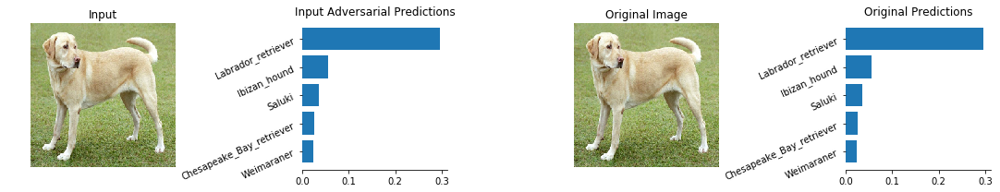

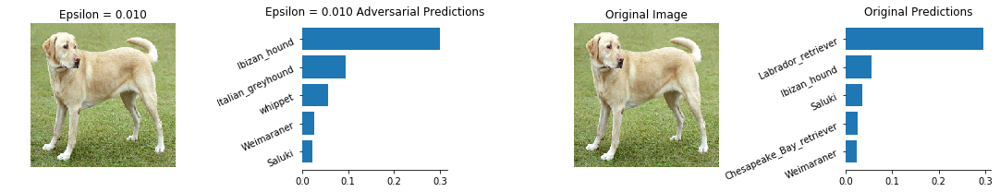

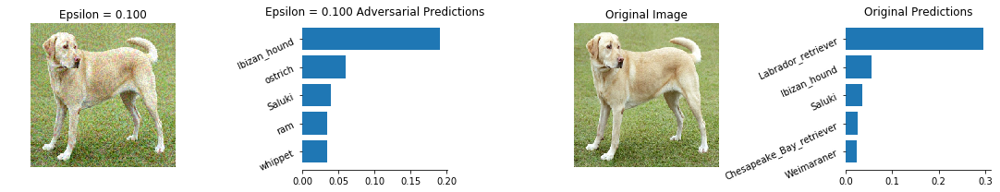

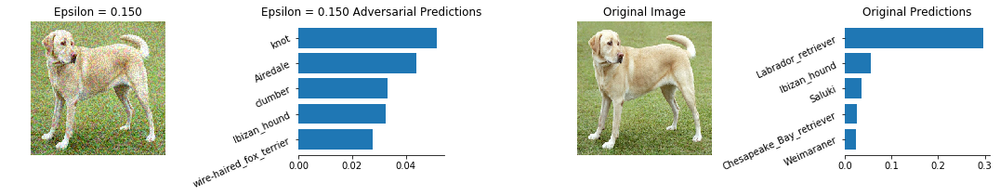

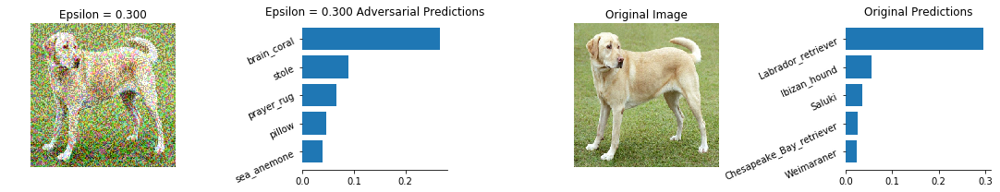

In [10]:
epsilons = [0, 0.01, 0.1, 0.15, 0.3]
descriptions = [('Epsilon = {:0.3f}'.format(eps) if eps else 'Input')
                for eps in epsilons]

for i, eps in enumerate(epsilons):
    ## START YOU CODE HERE
    adv_x = input_image_placeholder + eps*perturbations
    ## End
    adv_x = tf.clip_by_value(adv_x, -1, 1)
    # since the input_image_placeholder is tensor of shape [1, 224, 224, 3], we can skip the 1st array as it has only 1 image in the batch
    top_5_pred = display_images(
                                adv_x[0],
                                descriptions[i],
                                preprocessed_img,
                                reversed_img,
                                orig_top5
                                )



**TASK 3: What do you abserve?**

***

As we can see from above image and prediction comparisions, we have managed to make the pre-trained model to misclassify the image by adding some weighted noise onto the image. When the weight of noise($\epsilon$) is less than equal to .100, we do not see any visible manipulation in the input image but it's classification has changed slightly. The image is no longer correctly classified by the correct dog species. Adding more weightage to the noise($\epsilon$) causes further deviation from the correct classification with visible image distortions.


***

#  Part 2

Here, you are required to process adversarial attacks using FGSM for a small subset of [ImageNet Dataset](http://www.image-net.org/). We prepared 100 images from different categories (in `./input_dir/`), and the labels are encoded in `./input_dir/clean_image.list`.

For evaluation, each adversarial image generated by the attack model will be fed to an evaluation model, and we will calculate the successful rate of adversarial attacks. **The adversarial images that can fool the evaluation model with $\epsilon$ = 0.01 will be considered as a success**.



**Task 4: Goal**

***

With the previous FGSM example, you are required to implement an FGSM attack against all examples and calculate the success rate. Also, display the original image with the attacked image as well as the predicted class for each image.


In [11]:
# get imagenet class labels from index
home = expanduser("~")
# default imagenet json file from keras default file path
imagenet_json_file_path = os.path.join(home,'.keras','models','imagenet_class_index.json')
# get the imagenet index and label mapping in dictionary
f = open(imagenet_json_file_path,'r')
imagenet_json = json.load(f)
f.close()

In [12]:
# generation of adversarial image
def generate_and_predict_adversarial_image(image_input_label, preprocessed_img, orig_reversed_img, orig_top5):
    """
    Generates Adversarial image, performs classification and displays the Adversarial image and predictions versus
    the original input image and predictions
    
    params:
    
        image_input_label:
            The actual image category imagenet label index
        preprocesed_img:
            The preprocessed image in format suitable for model to consume and predict class labels.
        orig_reversed_img:
            The original image for comparision with adversarial image
        orig_top5:
            The original image prediction for comparision with adversarial image prediction
    
    returns:
        The top prediction for the Adversarial image classified.
    """
    input_label = np.array([image_input_label])
    perturbations = create_adversarial_pattern(input_image_placeholder, input_label, pretrained_model)
    # add noise to image
    eps = 0.01
    adv_x = input_image_placeholder + eps*perturbations
    ## End
    adv_x = tf.clip_by_value(adv_x, -1, 1)
    adv_desc = 'Epsilon = {:0.3f}'.format(eps)
    top_5_pred = display_images(adv_x[0], adv_desc, preprocessed_img, orig_reversed_img, orig_top5)
    return top_5_pred[0][1]

In [13]:
# Input test images directory and label file details
input_dir = 'input_dir'
image_label_file = os.path.join(input_dir, 'clean_image.list')

# read the image label file as dataframe
image_class_labels_df = pd.read_csv(image_label_file, sep=' ', header=None, names=['image_name','label_idx'])

    
def get_image_distortion_success_status(image_path):
    """
    Generates Adversarial image, performs classification and displays the Adversarial image and predictions versus
    the original input image and predictions
    
    params:
    
        image_path:
            The path of the image which is to be classified and distorted for adversarial attack.
    returns:
        Boolean success status where True indicates model misclassification for adversarial example.
    """
    image_name = image_path.split('/')[-1]
    image_raw = tf.io.read_file(image_path)
    image = tf.image.decode_png(image_raw)
    input_image = preprocess(image)
    reversed_image = reverse_preprocess(input_image)
    preprocessed_img, orig_reversed_img = sess.run([input_image, reversed_image])
    
    # actual image prediction
    orig_image_probs = sess.run([pretrained_model], {input_image_placeholder:preprocessed_img})
    orig_image_predicted_top5 = get_imagenet_label(orig_image_probs[0])
    
    # Acquiring actual image label
    # since there can only be one image with a give name hence iloc[0]
    actual_image_label_index = image_class_labels_df[image_class_labels_df['image_name']==image_name]['label_idx'].iloc[0]
    actual_image_label =  imagenet_json[str(actual_image_label_index)][1]
    
    # generating and predicting the adversarial image
    adversarial_image_class_pred = generate_and_predict_adversarial_image(
                                                                    actual_image_label_index,
                                                                    preprocessed_img,
                                                                    orig_reversed_img,
                                                                    orig_image_predicted_top5
                                                                    )
    if adversarial_image_class_pred==actual_image_label :
        print('Correct Prediction')
        return 0
    else:
        return 1

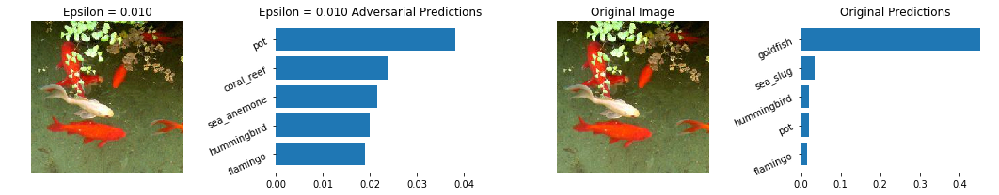

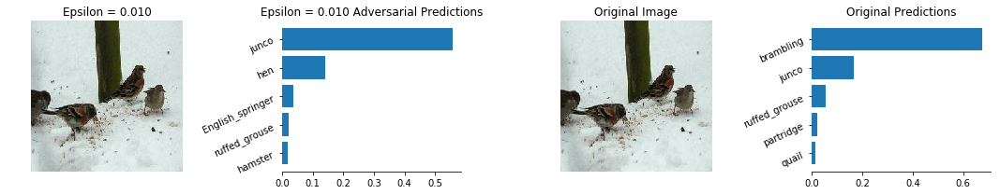

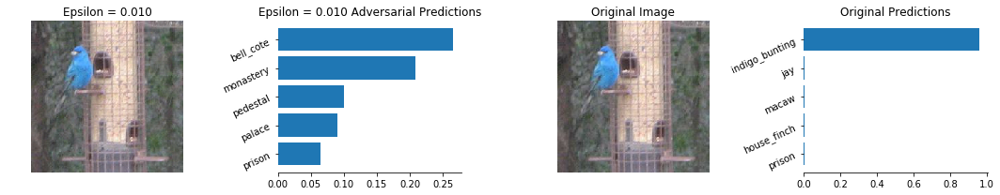

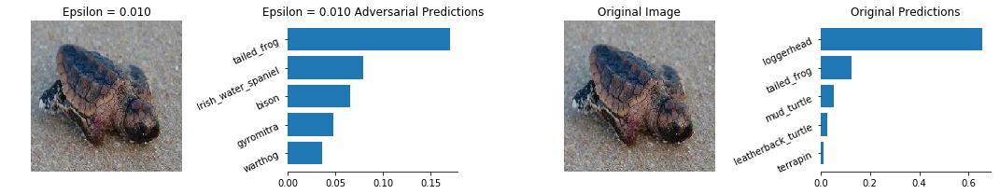

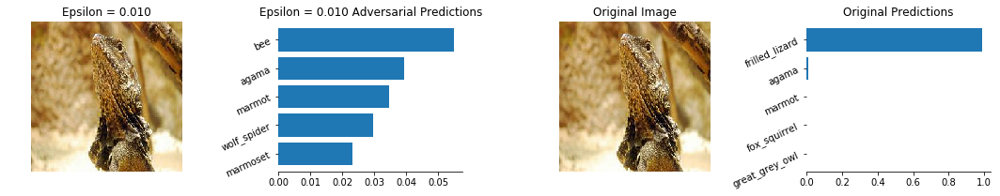

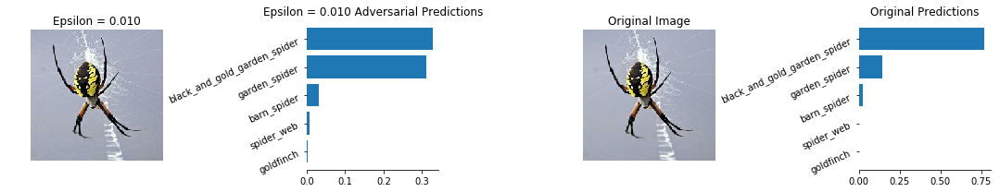

Correct Prediction


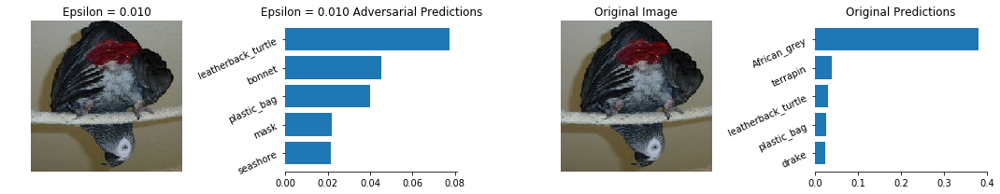

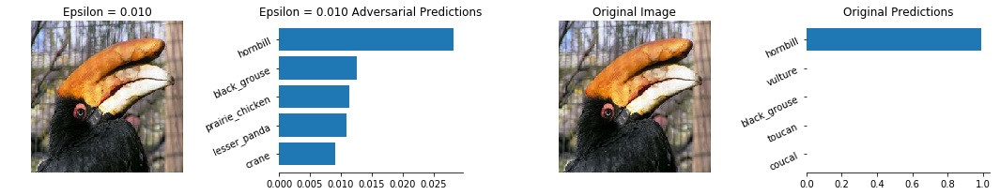

Correct Prediction


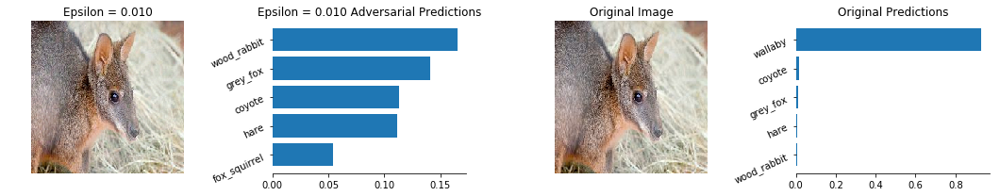

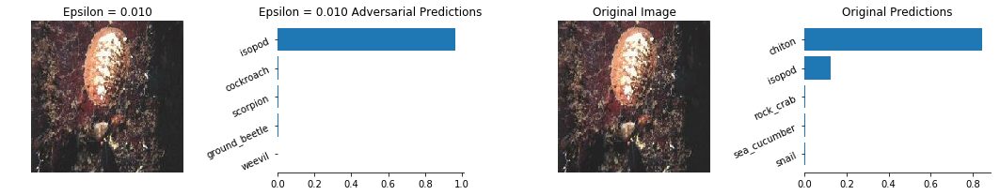

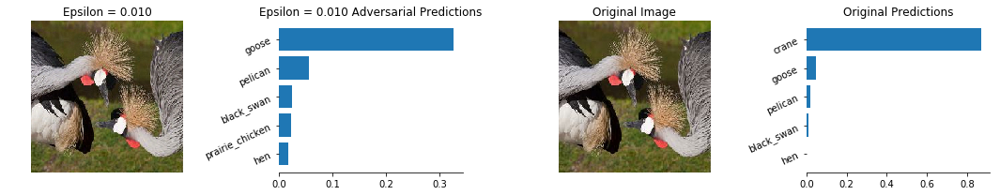

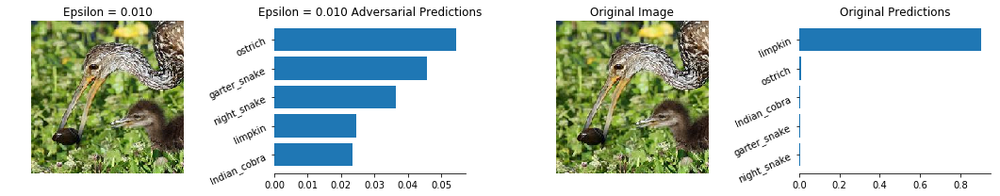

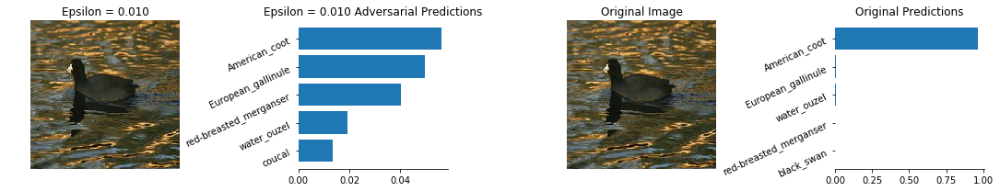

Correct Prediction


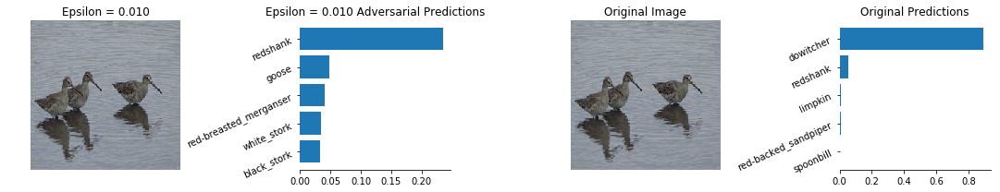

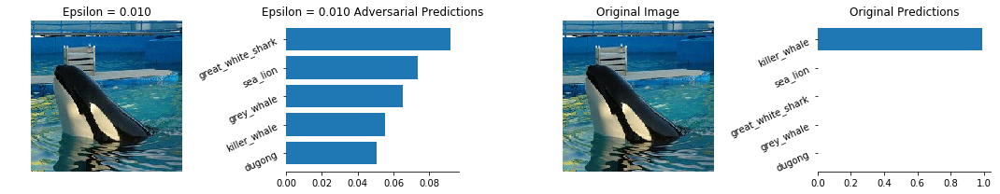

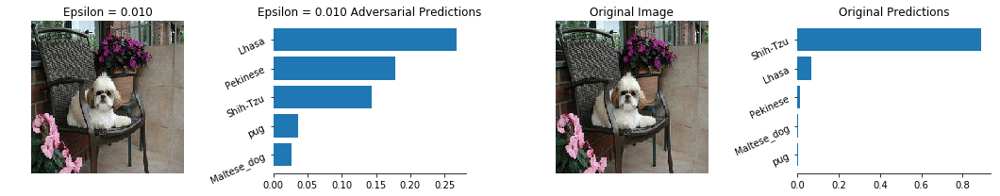

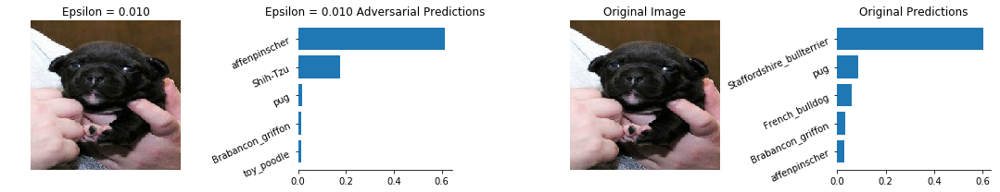

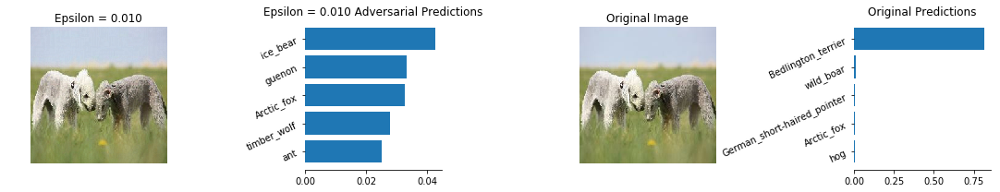

...

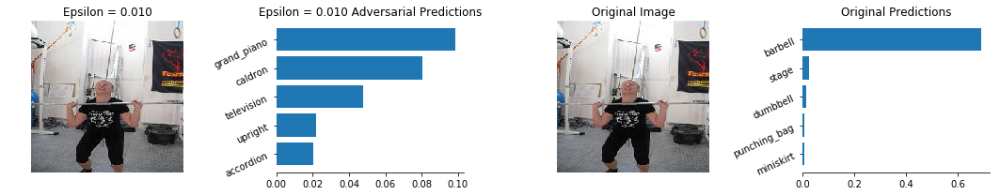

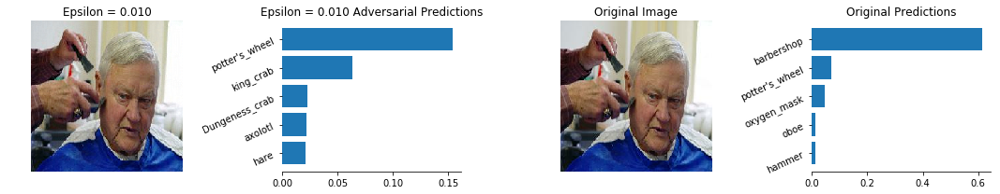

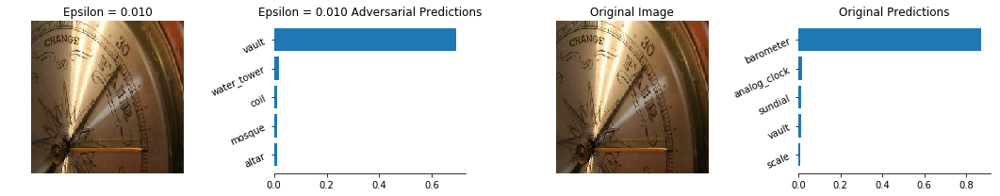

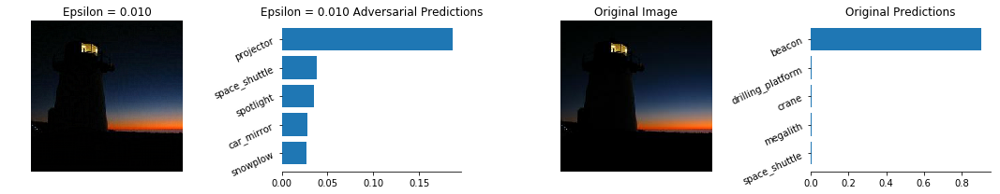

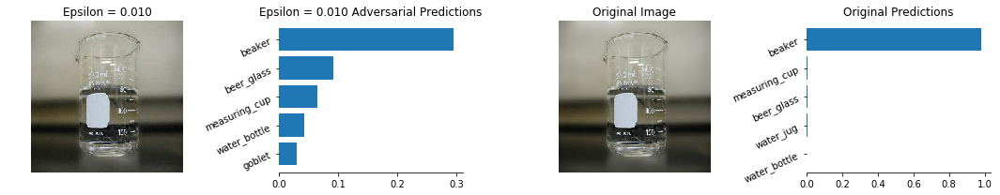

Correct Prediction


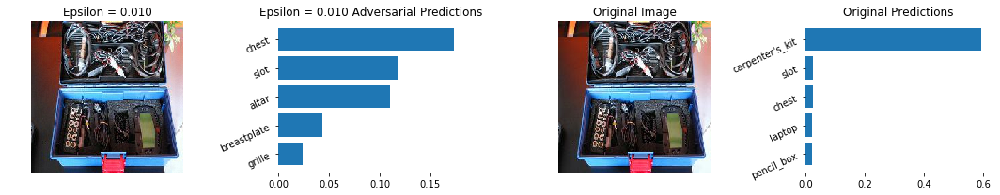

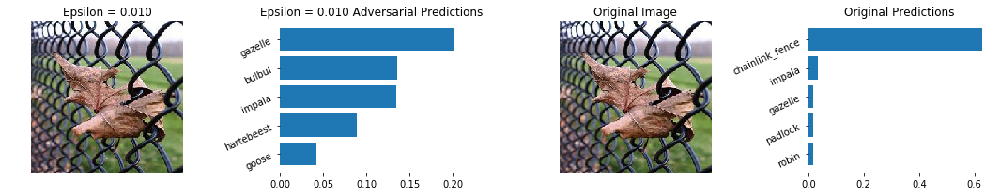

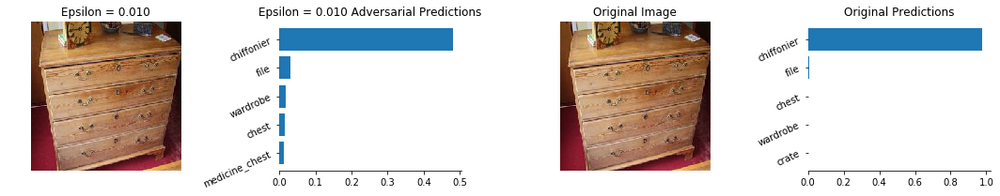

Correct Prediction


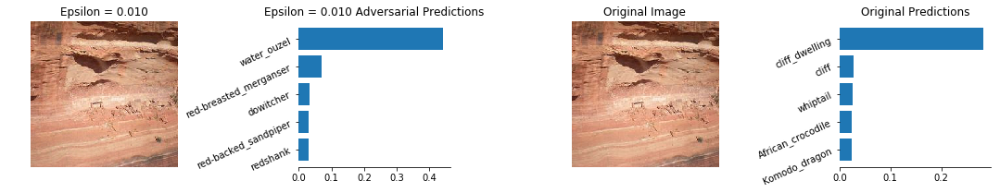

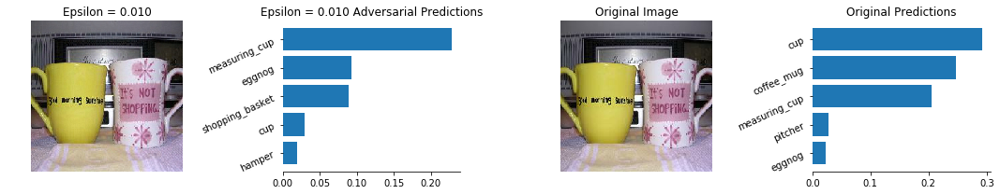

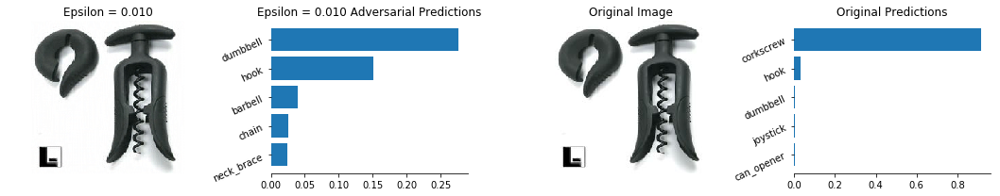

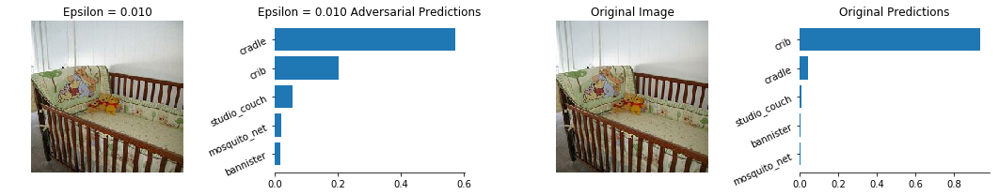

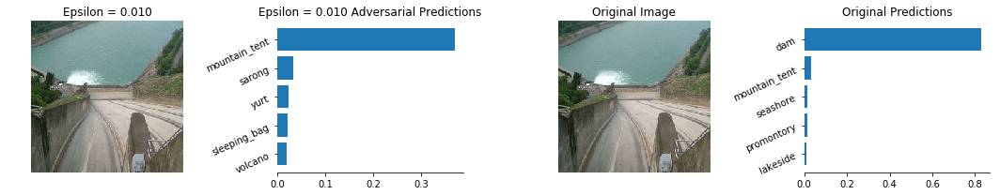

...

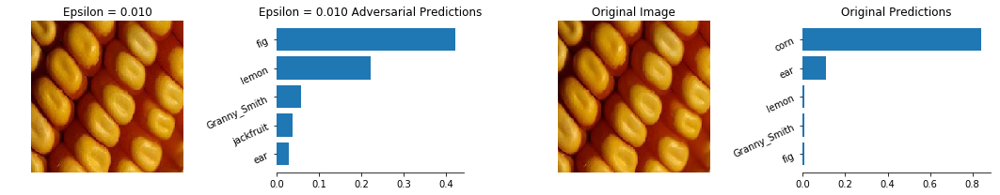

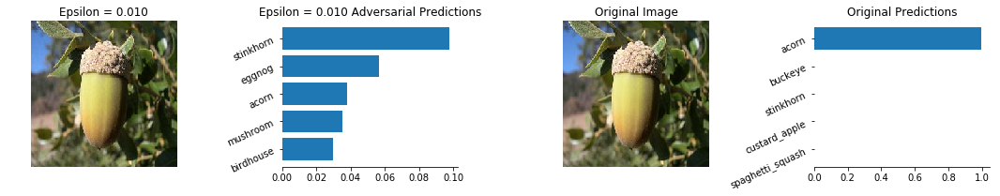

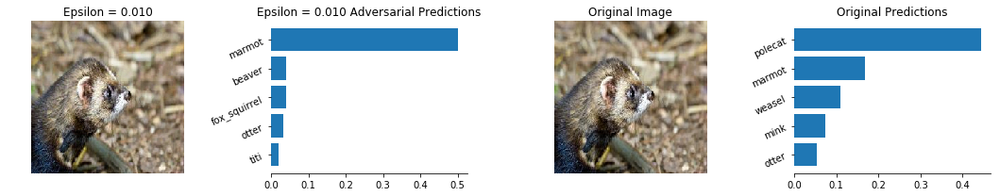

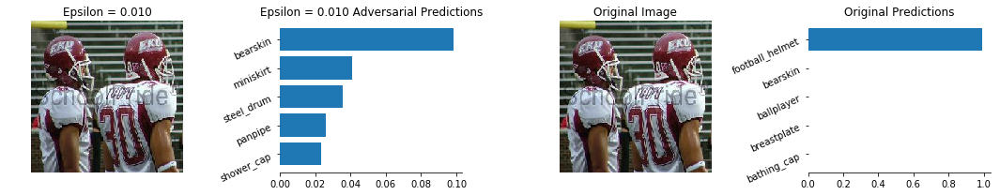

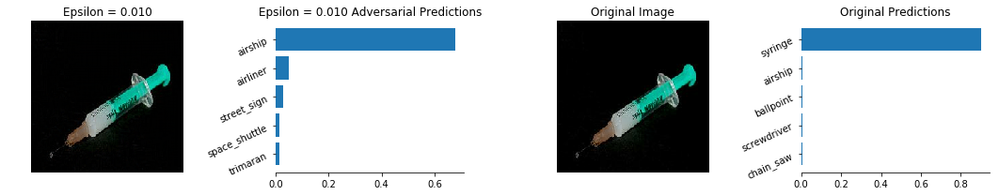

Overall success rate for 101 images is: 94.06%


In [14]:
# obtain the files in the test directory
image_input_list = os.listdir(input_dir)
# initialization
success_rate = 0
# for each file
for image in image_input_list:
    image_path = os.path.join(input_dir, image)
    # skip the image label file
    if image_label_file!= image_path:
        # compute for adversial attack is a success or not
        success_rate += get_image_distortion_success_status(image_path)

        num_image = len(image_input_list)
success_accuracy = '{:.2f}%'.format(success_rate*100/num_image)
print('Overall success rate for {} images is: {}'.format(num_image, success_accuracy))


***

# Congratulations!

You've come to the end of this assignment, and have seen a lot of the ways attack and fool an AI system. Here are the main points you should remember:

- It is very easy to fool a computer vision system if you know the model and its parameters.
- When designing an AI system, you need to think of adverse attacks againsts your system.

Congratulations on finishing this notebook! 

